In [1]:
import pandas as pd
org_housing = pd.read_csv("./housing.csv")
housing = org_housing.copy()

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

housing = org_housing.copy()
housing["income_cat"] = pd.cut(housing["median_income"], bins=[0, 1.5, 3.0, 4.5, 6, np.inf], labels=[1, 2, 3, 4, 5])

strat_train_set, strat_test_set = train_test_split(housing, test_size=0.20, stratify=housing["income_cat"], random_state=42)
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)
housing = strat_train_set.drop("median_house_value", axis=1)
housing_labels = strat_train_set["median_house_value"].copy()

In [2]:
# Simple Feature Engineering via attribute combinations
from ydata_profiling import ProfileReport

housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]
profile = ProfileReport(housing, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

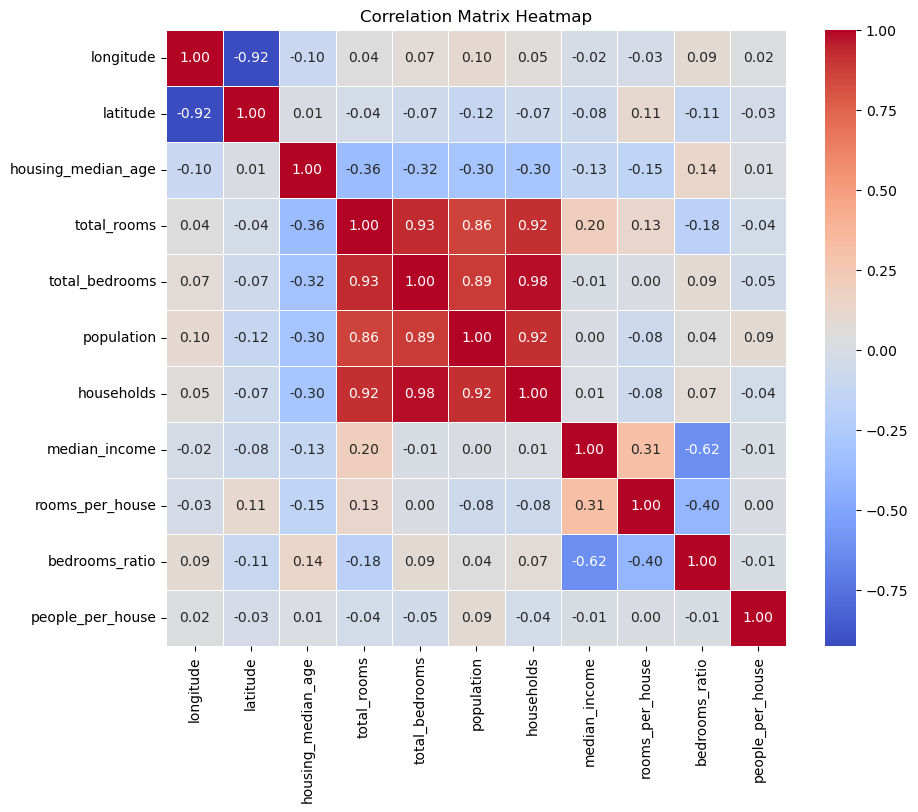

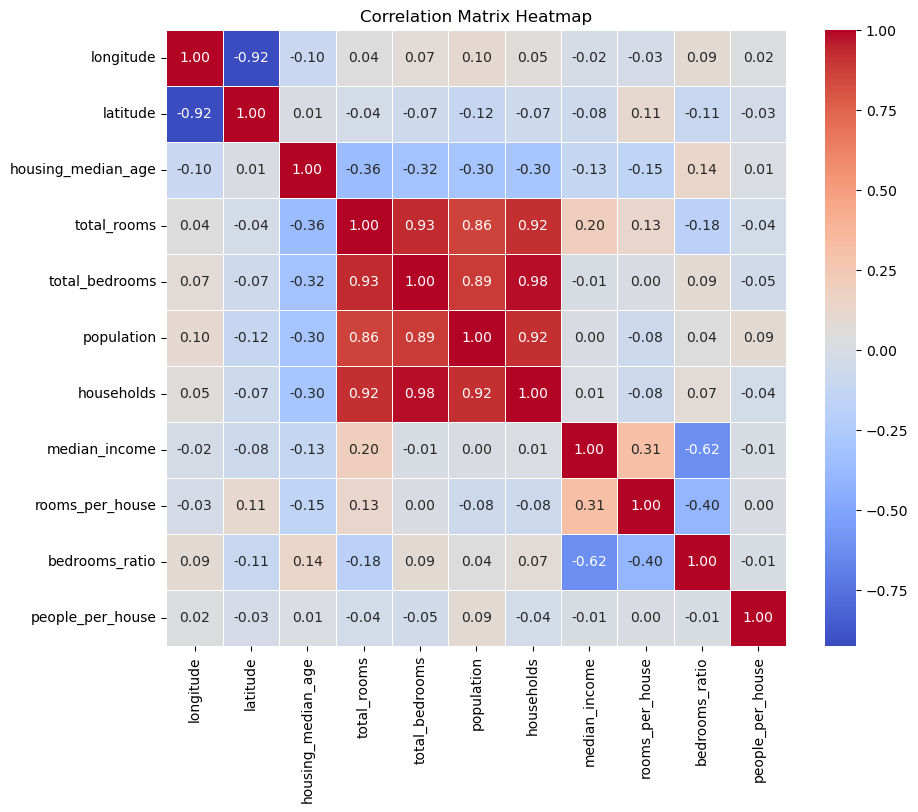

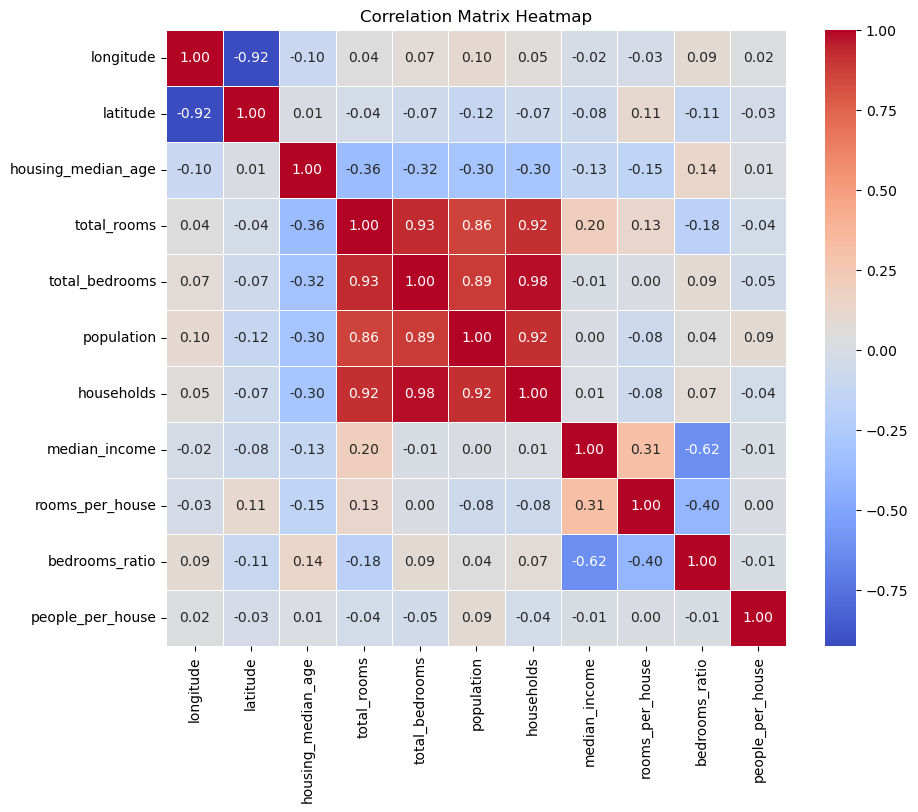

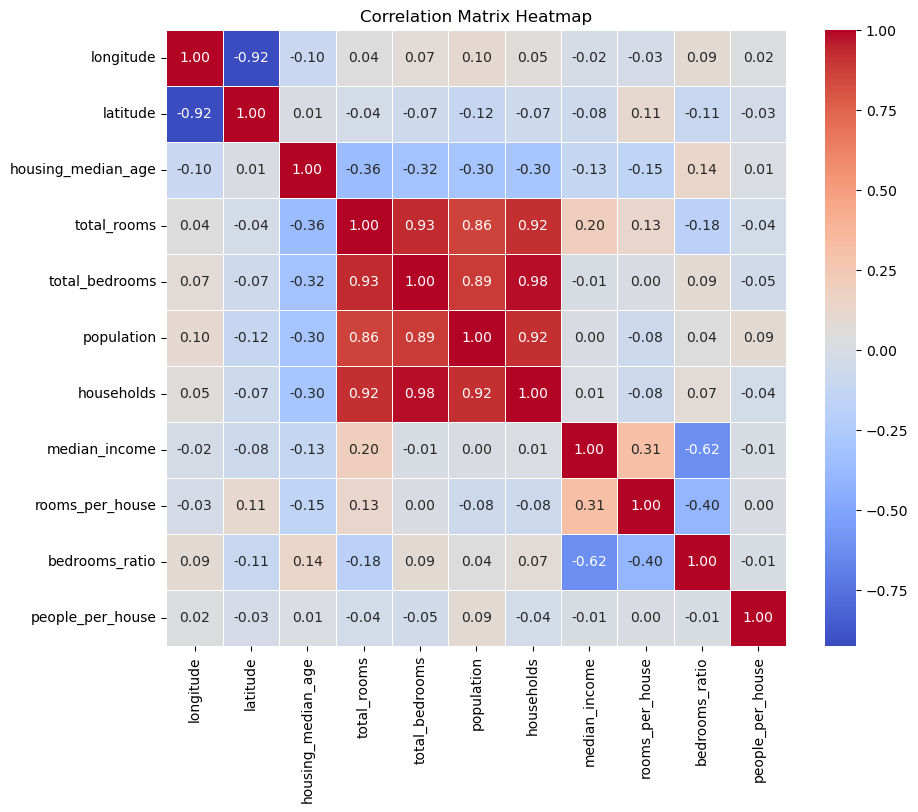

In [6]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
numerical_columns = housing.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()


plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
# Data Preprocessing -- fix missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")

housing_num = housing.select_dtypes(include=[np.number])
imputer.fit(housing_num)
housing_num.describe()
pd.DataFrame(imputer.transform(housing_num), columns=housing_num.columns).describe()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_house,bedrooms_ratio,people_per_house
count,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000
mean,-121.650980,37.262647,40.147059,1863.686275,431.813725,993.950980,396.568627,2.623432,4.889109,0.247549,2.702748
std,1.531719,1.441540,14.346764,1500.174637,347.128268,793.463212,328.056790,1.724656,1.780483,0.075253,1.040158
min,-122.960000,32.570000,2.000000,96.000000,29.000000,86.000000,23.000000,0.728600,2.045662,0.120827,1.471963
25%,-122.280000,37.800000,29.250000,938.250000,211.500000,529.250000,188.500000,1.430000,3.944413,0.199319,2.144695
50%,-122.270000,37.820000,48.000000,1478.000000,370.000000,758.000000,330.000000,2.095800,4.767069,0.228656,2.459200
75%,-122.252500,37.840000,52.000000,2435.000000,487.000000,1160.750000,467.750000,3.194725,5.462237,0.278422,3.049161
max,-117.040000,38.910000,52.000000,10565.000000,2477.000000,5690.000000,2323.000000,8.608800,15.015152,0.512500,10.272727


In [ ]:
# Data Preprocessing -- Handle text attributes
from sklearn.preprocessing import OneHotEncoder

### one hot encoder can handle unknown values by ignoring them! Look up documentation

housing_cat = housing.select_dtypes(include=['object']) # PandasV2
cat_encoder = OneHotEncoder()
housing_cat_1hot = cat_encoder.fit_transform(housing_cat)
housing_cat_1hot.toarray()
cat_encoder.categories_


[array(['<1H OCEAN', 'INLAND', 'NEAR BAY', 'NEAR OCEAN'], dtype=object)]

In [ ]:
# Data Preprocessing -- Feature Scaling
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
housing_num_min_max_scaled = min_max_scaler.fit_transform(housing_num)

from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
housing_num_std_scaled = std_scaler.fit_transform(housing_num)


In [ ]:
# Data Preprocessing -- Custom Transformers

from sklearn.preprocessing import FunctionTransformer
log_transformer = FunctionTransformer(np.log, inverse_func=np.exp) # inverse_func option
log_transformer.transform(housing[["population"]])


,population
65,6.403574
121,7.803843
71,6.366470
97,5.308268
105,7.053586
...,...
117,8.646466
90,6.684612
1,7.783641
51,6.966967


In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted
class StandardScalerClone(BaseEstimator, TransformerMixin):
    def __init__(self, with_mean=True):  # no *args or **kwargs!
        self.with_mean = with_mean

    def fit(self, X, y=None):  # y is required even though we don't use it
        X = check_array(X)  # checks that X is an array with finite float values
        self.mean_ = X.mean(axis=0)
        self.scale_ = X.std(axis=0)
        self.n_features_in_ = X.shape[1]  # every estimator stores this in fit()
        return self  # always return self!

    def transform(self, X):
        check_is_fitted(self)  # looks for learned attributes (with trailing _)
        X = check_array(X)
        assert self.n_features_in_ == X.shape[1]
        if self.with_mean:
            X = X - self.mean_
        return X / self.scale_


In [ ]:
from sklearn.cluster import KMeans
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10,
                              random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans


In [ ]:
# Define the ClusterSimilarity class
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10, random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def fit_transform(self, X, y=None, sample_weight=None):
        self.fit(X, y, sample_weight)
        return self.transform(X)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]


In [ ]:
# Generate some sample data
X, y = make_blobs(n_samples=10, centers=3, n_features=2, random_state=42)

# Instantiate the ClusterSimilarity transformer
cluster_sim = ClusterSimilarity(n_clusters=3, gamma=0.5, random_state=42)

# Fit and transform the data
similarity_matrix = cluster_sim.fit_transform(X)

# Print the original data and the resulting similarity matrix
print("Original Data (X):")
print(X)
print("\nCluster Centers:")
print(cluster_sim.kmeans_.cluster_centers_)
print("\nSimilarity Matrix (fit_transform output):")
print(similarity_matrix)


Original Data (X):
[[-5.41397842 -7.10588589]
 [-7.42400992 -6.769187  ]
 [ 3.62704772  2.28741702]
 [-6.81209899 -8.30485778]
 [-2.26723535  7.10100588]
 [-2.97867201  9.55684617]
 [-0.92998481  9.78172086]
 [ 2.914961    1.41088215]
 [ 3.73185476  0.56086598]
 [-2.97261532  8.54855637]]

Cluster Centers:
[[-6.55002911 -7.39331023]
 [-2.28712687  8.74703232]
 [ 3.42462116  1.41972172]]

Similarity Matrix (fit_transform output):
[[5.03278314e-01 2.01625537e-57 1.78942476e-33]
 [5.61756878e-01 9.79826866e-59 7.61772432e-41]
 [1.44263700e-43 2.20758932e-17 6.72377177e-01]
 [6.37755829e-01 2.59768844e-68 5.12843842e-44]
 [2.49800830e-50 2.57973257e-01 9.04006383e-15]
 [6.95471207e-66 5.67215161e-01 5.23079534e-24]
 [1.22170360e-71 2.33118709e-01 4.99726363e-20]
 [5.18478201e-37 2.73497668e-18 8.78169364e-01]
 [2.01903751e-37 3.81418698e-23 6.59671807e-01]
 [1.08267553e-58 7.75192762e-01 1.19631119e-20]]


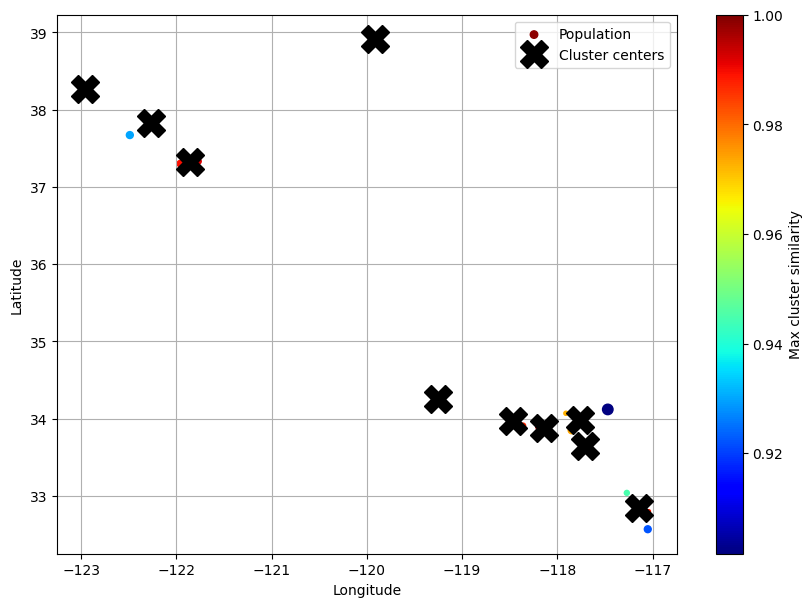

In [ ]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
similarities = cluster_simil.fit_transform(housing[["latitude", "longitude"]],
                                           sample_weight=housing_labels)

housing_renamed = housing.rename(columns={
    "latitude": "Latitude", "longitude": "Longitude",
    "population": "Population",
    "median_house_value": "Median house value (ᴜsᴅ)"})
housing_renamed["Max cluster similarity"] = similarities.max(axis=1)

housing_renamed.plot(kind="scatter", x="Longitude", y="Latitude", grid=True,
                     s=housing_renamed["Population"] / 100, label="Population",
                     c="Max cluster similarity",
                     cmap="jet", colorbar=True,
                     legend=True, sharex=False, figsize=(10, 7))
plt.plot(cluster_simil.kmeans_.cluster_centers_[:, 1],
         cluster_simil.kmeans_.cluster_centers_[:, 0],
         linestyle="", color="black", marker="X", markersize=20,
         label="Cluster centers")
plt.legend(loc="upper right")
plt.show()


In [ ]:
from sklearn.pipeline import Pipeline, make_pipeline

num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])

num_pipeline
num_pipeline.named_steps

x = pd.DataFrame(num_pipeline.fit_transform(housing_num), columns=num_pipeline.get_feature_names_out())
x["total_bedrooms"].isnull().sum()


num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())
from sklearn import set_config


num_pipeline
num_pipeline.named_steps


{'simpleimputer': SimpleImputer(strategy='median'),
 'standardscaler': StandardScaler()}

In [ ]:
# Explicit
from sklearn.compose import ColumnTransformer

num_attribs = ["longitude", "latitude", "housing_median_age", "total_rooms",
               "total_bedrooms", "population", "households", "median_income"]
cat_attribs = ["ocean_proximity"]

num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    StandardScaler())

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = ColumnTransformer([
    ("num", num_pipeline, num_attribs),
    ("cat", cat_pipeline, cat_attribs),
])


In [ ]:
from sklearn.compose import make_column_selector, make_column_transformer


num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    StandardScaler())

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object)),
)


In [ ]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared_fr = pd.DataFrame(
    housing_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=housing.index)
housing_prepared_fr.head(2)


,num__longitude,num__latitude,num__housing_median_age,num__total_rooms,num__total_bedrooms,num__population,num__households,num__median_income,cat__ocean_proximity_<1H OCEAN,cat__ocean_proximity_INLAND,cat__ocean_proximity_NEAR BAY,cat__ocean_proximity_NEAR OCEAN
65,-0.425812,0.381575,0.830255,-0.571868,-0.645047,-0.493881,-0.641973,-0.848822,0.0,0.0,1.0,0.0
121,3.018635,-3.271377,-1.901552,0.680809,0.417420,1.844118,0.522083,0.318246,0.0,0.0,0.0,1.0


In [ ]:
def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out

def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())


In [ ]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age


In [ ]:
def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out


In [ ]:
def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())


In [ ]:
log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())


In [ ]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)

In [ ]:
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())


In [ ]:
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age


In [ ]:
remainder=default_num_pipeline
ratio_pipeline().fit_transform(housing[["total_rooms", "households"]])

housing_prepared = preprocessing.fit_transform(housing)
housing_prepared.shape
preprocessing.get_feature_names_out()


array(['bedrooms__ratio', 'rooms_per_house__ratio',
       'people_per_house__ratio', 'log__total_bedrooms',
       'log__total_rooms', 'log__population', 'log__households',
       'log__median_income', 'geo__Cluster 0 similarity',
       'geo__Cluster 1 similarity', 'geo__Cluster 2 similarity',
       'geo__Cluster 3 similarity', 'geo__Cluster 4 similarity',
       'geo__Cluster 5 similarity', 'geo__Cluster 6 similarity',
       'geo__Cluster 7 similarity', 'geo__Cluster 8 similarity',
       'geo__Cluster 9 similarity', 'cat__ocean_proximity_<1H OCEAN',
       'cat__ocean_proximity_INLAND', 'cat__ocean_proximity_NEAR BAY',
       'cat__ocean_proximity_NEAR OCEAN', 'remainder__housing_median_age',
       'remainder__rooms_per_house', 'remainder__bedrooms_ratio',
       'remainder__people_per_house'], dtype=object)

In [ ]:
from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(housing, housing_labels)
housing_predictions = lin_reg.predict(housing)
housing_predictions[:5].round(-2)
housing_labels.iloc[:5].values
lin_reg.get_params()
error_ratios = housing_predictions[:5].round(-2) / housing_labels.iloc[:5].values - 1
print(", ".join([f"{100 * ratio:.1f}%" for ratio in error_ratios]))


3.3%, -19.6%, -14.4%, -7.7%, -16.7%


In [ ]:
from sklearn.metrics import root_mean_squared_error
lin_rmse = root_mean_squared_error(housing_labels, housing_predictions)
lin_rmse


61767.58433341535

In [ ]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(housing, housing_labels)
housing_predictions = tree_reg.predict(housing)
tree_rmse = root_mean_squared_error(housing_labels, housing_predictions)
tree_rmse


0.0

In [ ]:
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)


In [ ]:
tree_rmses.mean()
pd.Series(tree_rmses).describe()


,0
count,10.000000
mean,82956.209723
std,35780.320375
min,35760.117449
25%,52955.096079
50%,86287.431119
75%,116571.651702
max,127996.249945


In [ ]:
lin_rmses = -cross_val_score(lin_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()


,0
count,1.000000e+01
mean,3.469506e+05
std,4.495065e+05
min,5.415514e+04
25%,9.463573e+04
50%,1.854911e+05
75%,2.395613e+05
max,1.428339e+06


In [ ]:
lin_rmses = -cross_val_score(lin_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()


,0
count,1.000000e+01
mean,3.469506e+05
std,4.495065e+05
min,5.415514e+04
25%,9.463573e+04
50%,1.854911e+05
75%,2.395613e+05
max,1.428339e+06


In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, housing, housing_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()
forest_reg.fit(housing, housing_labels)
housing_predictions = forest_reg.predict(housing)
forest_rmse = root_mean_squared_error(housing_labels, housing_predictions)
forest_rmse


25924.210581265626

In [ ]:
from sklearn.model_selection import GridSearchCV

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])
param_grid = [
    {'preprocessing__geo__n_clusters': [5, 8, 10],
     'random_forest__max_features': [4, 6, 8]},
    {'preprocessing__geo__n_clusters': [10, 15],
     'random_forest__max_features': [6, 8, 10]},
]
grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(housing, housing_labels)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                     SimpleImputer(strategy='median')),
                                                                                    ('standardscaler',
                                                                                     StandardScaler())]),
                                                          transformers=[('bedrooms',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('functiontransformer',
                                                                                          FunctionTransformer(feature_names_out=<f...
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7d323ae57790>)])),
                                       ('random_forest',
                                        RandomForestRegressor(random_state=42))]),
             param_grid=[{'preprocessing__geo__n_clusters': [5, 8, 10],
                          'random_forest__max_features': [4, 6, 8]},
                         {'preprocessing__geo__n_clusters': [10, 15],
                          'random_forest__max_features': [6, 8, 10]}],
             scoring='neg_root_mean_squared_error')

In [ ]:
grid_search.best_params_


{'preprocessing__geo__n_clusters': 15, 'random_forest__max_features': 8}

In [ ]:
-grid_search.best_score_

73961.76413820095

In [ ]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)

# extra code – these few lines of code just make the DataFrame look nicer
cv_res = cv_res[["param_preprocessing__geo__n_clusters",
                 "param_random_forest__max_features", "split0_test_score",
                 "split1_test_score", "split2_test_score", "mean_test_score"]]
score_cols = ["split0", "split1", "split2", "mean_test_rmse"]
cv_res.columns = ["n_clusters", "max_features"] + score_cols
cv_res[score_cols] = -cv_res[score_cols].round().astype(np.int64)

cv_res.head()

,n_clusters,max_features,split0,split1,split2,mean_test_rmse
13,15,8,95036,52509,74341,73962
12,15,6,96132,53065,74683,74627
11,10,10,94458,56432,73768,74886
5,8,8,94174,58064,73389,75209
14,15,10,92419,57876,75499,75265


In [ ]:
import pandas as pd
import joblib

model = grid_search.best_estimator_
# Save the model
joblib.dump(model, 'random_forest_model_v1.pkl')
model = grid_search.best_estimator_
root_mean_squared_error(housing_labels, model.predict(housing))
# test = strat_test_set.drop("median_house_value", axis=1)
# test_labels = strat_test_set["median_house_value"].copy()
# root_mean_squared_error(test_labels, model.predict(test))


24454.12586287244

In [ ]:
final_model = joblib.load('random_forest_model_v1.pkl')
root_mean_squared_error(housing_labels, final_model.predict(housing))


24454.12586287244

In [ ]:
!pip install requests

In [ ]:
!pip install dill

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 4.1 MB/s eta 0:00:00


In [ ]:
import dill
with open('final_model.pkl', 'wb') as f:
    dill.dump(final_model, f)